In [0]:
!pip install lime > /dev/null

## Define classifier functions

In [0]:
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn import preprocessing
from sklearn.linear_model import LogisticRegression
from sklearn import metrics
from math import log
import tarfile
import random
import matplotlib.pyplot as plt
import copy
import numpy as np

In [0]:
def read_files(tarfname):
    """Read the training and development data from the sentiment tar file.
    The returned object contains various fields that store sentiment data, such as:

    train_data,dev_data: array of documents (array of words)
    train_labels,dev_labels: the true string label for each document (same length as data)

    The data is also preprocessed for use with scikit-learn, as:

    count_vec: Count vectorizer used to process the data and extract term counts.
    tfidf_vec: Tf-idf Vectorizer used to process the data and extract features
    trainX,devX: array of vectors representing tf-idf values, i.e. documents processed through the vectorizer
    le: LabelEncoder, i.e. a mapper from string labels to ints (stored for reapplication)
    target_labels: List of labels (same order as used in le)
    trainy,devy: array of int labels, one for each document
    """
    
    # Read in the tar file.
    tar = tarfile.open(tarfname, "r:gz")
    trainname = "train.tsv"
    devname = "dev.tsv"
    for member in tar.getmembers():
        if 'train.tsv' in member.name:
            trainname = member.name
        elif 'dev.tsv' in member.name:
            devname = member.name
    
    # Create a sentiment object to store the state.
    class Data: pass
    sentiment = Data()
    
    # Read in all the documents in the corpus.
    print("-- train data")
    sentiment.train_data, sentiment.train_labels = read_tsv(tar,trainname)
    print("Number of documents in training data: {0:10d}".format(len(sentiment.train_data)))
    
    print("-- dev data")
    sentiment.dev_data, sentiment.dev_labels = read_tsv(tar, devname)
    print("Number of documents in dev data: {0:10d}".format(len(sentiment.dev_data)))
    
    # Converting the documents into word vectors with it's tf-idf weights.
    sentiment.count_vec = CountVectorizer(ngram_range=(1,2))
    sentiment.train_count = sentiment.count_vec.fit_transform(sentiment.train_data)
    sentiment.tfidf_vec = TfidfVectorizer(ngram_range=(1,2))
    sentiment.trainX = sentiment.tfidf_vec.fit_transform(sentiment.train_data)
    sentiment.devX = sentiment.tfidf_vec.transform(sentiment.dev_data)
    
    # Pre-process the labels.
    sentiment.le = preprocessing.LabelEncoder()
    sentiment.le.fit(sentiment.train_labels)
    sentiment.target_labels = sentiment.le.classes_
    sentiment.trainy = sentiment.le.transform(sentiment.train_labels)
    sentiment.devy = sentiment.le.transform(sentiment.dev_labels)
    
    # Close the tar file.
    tar.close()
    
    # Return the sentiment object.
    return sentiment

In [0]:
def read_tsv(tar, fname):
    """ Read in the corpus and return the word vector of the document and its label. """
    member = tar.getmember(fname)
    print(member.name)
    tf = tar.extractfile(member)
    data = []
    labels = []
    for line in tf:
        line = line.decode("utf-8")
        (label,text) = line.strip().split("\t")
        labels.append(label)
        data.append(text)
    return data, labels

In [0]:
def read_unlabeled(tarfname, sentiment):
    """Reads the unlabeled data.

    The returned object contains three fields that represent the unlabeled data.

    data: documents, represented as sequence of words
    fnames: list of filenames, one for each document
    X: bag of word vector for each document, using the sentiment.vectorizer
    """
    import tarfile
    tar = tarfile.open(tarfname, "r:gz")
    class Data: pass
    unlabeled = Data()
    unlabeled.data = []
    
    unlabeledname = "unlabeled.tsv"
    for member in tar.getmembers():
        if 'unlabeled.tsv' in member.name:
            unlabeledname = member.name
            
    print(unlabeledname)
    tf = tar.extractfile(unlabeledname)
    for line in tf:
        line = line.decode("utf-8")
        text = line.strip()
        unlabeled.data.append(text)
        
            
    unlabeled.X = sentiment.tfidf_vec.transform(unlabeled.data)
    print(unlabeled.X.shape)
    tar.close()
    return unlabeled

In [0]:
def train_classifier(sentiment):
    """ Trains the classifier with the given sentiment data. Also fine tunes the regularization parameter.

        Returns the classifier that performs the best on validation data.
    """
    c_values = [100]
    best_clf = None
    best_accuracy = 0.0
    best_c = 0.0
    train_acc_values = []
    dev_acc_values = []

    for c in c_values:
        # Fit the classifier
        clf = LogisticRegression(C=c, random_state=0, solver='lbfgs', max_iter=10000)
        clf.fit(sentiment.trainX, sentiment.trainy)

        # Evaluate performance on training data
        y = clf.predict(sentiment.trainX)
        acc = metrics.accuracy_score(sentiment.trainy, y)
        train_acc_values.append(acc)

        # Evaluate performance on validation data
        y = clf.predict(sentiment.devX)
        acc = metrics.accuracy_score(sentiment.devy, y)
        dev_acc_values.append(acc)

        # Get the better classifier.
        if acc > best_accuracy:
            best_clf = clf
            best_accuracy = acc
            best_c = c

    # Which classifier is chosen?
    print("Classifier chosen with c-value: {0:5f}".format(best_c))
    
    # Print out the evaluation scores on training and validation data.
    print("Evaluation of classifier on different c values:")
    print("{0:10s} | {1:10s} | {2:10s}".format('c', 'train_acc', 'dev_acc'))
    print("--------------------------------------------------")
    for i in range(len(c_values)):
        print("{0:10f} | {1:10f} | {2:10f}".format(c_values[i], train_acc_values[i], dev_acc_values[i]))
    
    return best_clf

# Original Dataset

##Reading in files

In [7]:
!pip install gdown > /dev/null
!gdown "https://drive.google.com/uc?export=download&id=1CgWoV63o4aWNWyaVXnjpDRdsBZXzBu_m"

Downloading...
From: https://drive.google.com/uc?export=download&id=1CgWoV63o4aWNWyaVXnjpDRdsBZXzBu_m
To: /content/sentiment.tar.gz
5.92MB [00:00, 92.5MB/s]


In [8]:
print("Reading data")
tarfname = "sentiment.tar.gz"
sentiment = read_files(tarfname)
print("\nReading unlabeled data")
unlabeled = read_unlabeled(tarfname, sentiment)

Reading data
-- train data
sentiment/train.tsv
Number of documents in training data:       4582
-- dev data
sentiment/dev.tsv
Number of documents in dev data:        458

Reading unlabeled data
sentiment/unlabeled.tsv
(91524, 70695)


##Training classifier

In [9]:
print("\nTraining classifier")
cls = train_classifier(sentiment)


Training classifier
Classifier chosen with c-value: 100.000000
Evaluation of classifier on different c values:
c          | train_acc  | dev_acc   
--------------------------------------------------
100.000000 |   1.000000 |   0.792576


## Explaining data


### Setup

In [0]:
from lime import lime_text
from sklearn.pipeline import make_pipeline
c = make_pipeline(sentiment.tfidf_vec, cls)

In [0]:
from lime.lime_text import LimeTextExplainer
explainer = LimeTextExplainer(class_names=sentiment.target_labels)

In [0]:
def plot_words(sentence, explainer, c, label_names):
  import matplotlib.pyplot as plt
  
  exp_inst = explainer.explain_instance(sentence, c.predict_proba, num_features=len(sentence), top_labels=2)
  labels = exp_inst.available_labels()
  
  max_val = 0
  maps = {}
  for label in labels:
    l = exp_inst.as_list(label)
    values = [weight for (word, weight) in l]
    max_val = max(max_val, max(values))
    m = {word:weight for (word, weight) in l}
    maps[label] = m
  
  fig,ax = plt.subplots(figsize=(10,10))
  
  keys = maps[labels[0]].keys()
  for word in keys:
    x, y = maps[labels[0]][word], maps[labels[1]][word]
    ax.plot(x, y, 'ro')
    ax.text(x+0.0002, y+0.0002, word, fontsize=12)
  
  ax.axis('equal')
  ax.axhline(y=0, color='k')
  ax.axvline(x=0, color='k')
  ax.grid(True, which='both')
  plt.xlabel(label_names[labels[0]], fontsize=24)
  plt.ylabel(label_names[labels[1]], fontsize=24)

In [0]:
def explain_sentences(sentences):
  for sentence in sentences:
    plot_words(sentence, explainer, c, sentiment.target_labels)
    exp = explainer.explain_instance(sentence, c.predict_proba, num_features=10)
    exp.show_in_notebook(text=True)

In [14]:
print("\nReading unlabeled data")
unlabeled = read_unlabeled(tarfname, sentiment)


Reading unlabeled data
sentiment/unlabeled.tsv
(91524, 70695)


In [0]:
dataset = sentiment.dev_data
labels = sentiment.dev_labels

predicted_proba = c.predict_proba(dataset)


In [0]:
tp = []
tn = []
fp = []
fn = []
lowest_confidence = 1
lowest_idx = -1
for i in range(len(dataset)):
  max_proba = max(predicted_proba[i])
  if max_proba < lowest_confidence:
    lowest_confidence = max_proba
    lowest_idx = i
  prediction = sentiment.target_labels[np.argmax(predicted_proba[i])]
  if prediction == labels[i]:
    if prediction == 'POSITIVE':
      tp.append(dataset[i])
    else:
      tn.append(dataset[i])
  else:
    if prediction == 'POSITIVE':
      fp.append(dataset[i])
    else:
      fn.append(dataset[i])
      
lowest_confidence_sent = dataset[lowest_idx]

###Explanation for true positive example

/usr/lib/python3.6/re.py:212: FutureWarning: split() requires a non-empty pattern match.
  return _compile(pattern, flags).split(string, maxsplit)
/usr/lib/python3.6/re.py:212: FutureWarning: split() requires a non-empty pattern match.
  return _compile(pattern, flags).split(string, maxsplit)


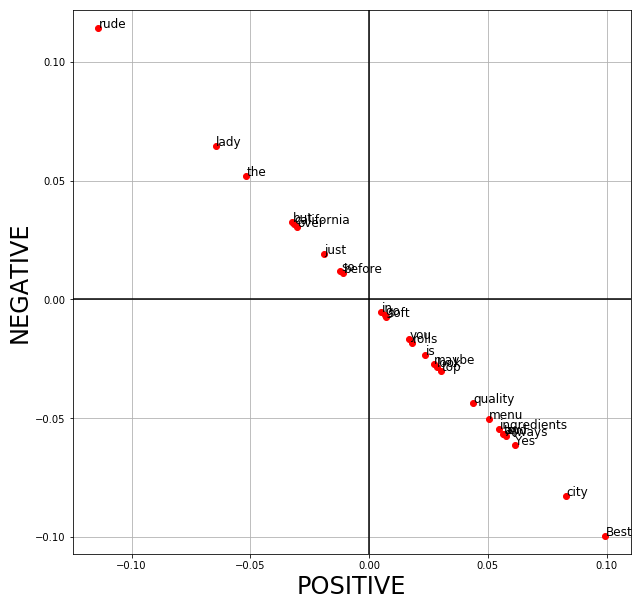

In [17]:
explain_sentences([tp[10]])

###Explanation for true negative example

/usr/lib/python3.6/re.py:212: FutureWarning: split() requires a non-empty pattern match.
  return _compile(pattern, flags).split(string, maxsplit)
/usr/lib/python3.6/re.py:212: FutureWarning: split() requires a non-empty pattern match.
  return _compile(pattern, flags).split(string, maxsplit)


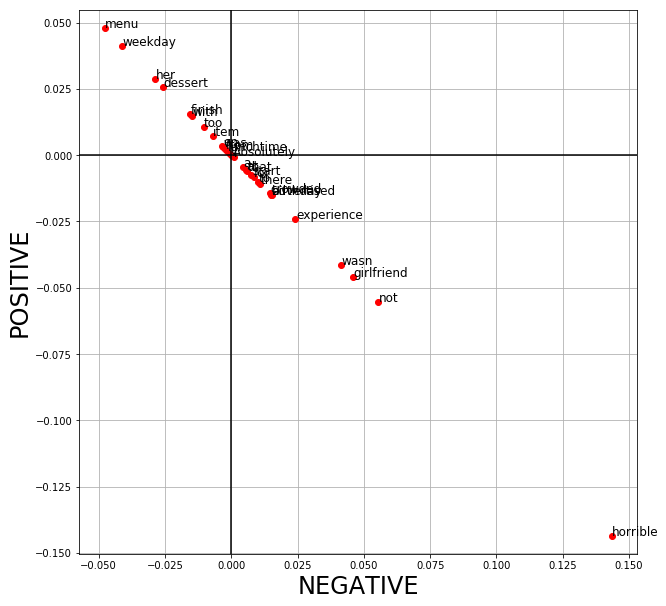

In [18]:
explain_sentences([tn[15]])

###Explanation for false positive example

/usr/lib/python3.6/re.py:212: FutureWarning: split() requires a non-empty pattern match.
  return _compile(pattern, flags).split(string, maxsplit)
/usr/lib/python3.6/re.py:212: FutureWarning: split() requires a non-empty pattern match.
  return _compile(pattern, flags).split(string, maxsplit)


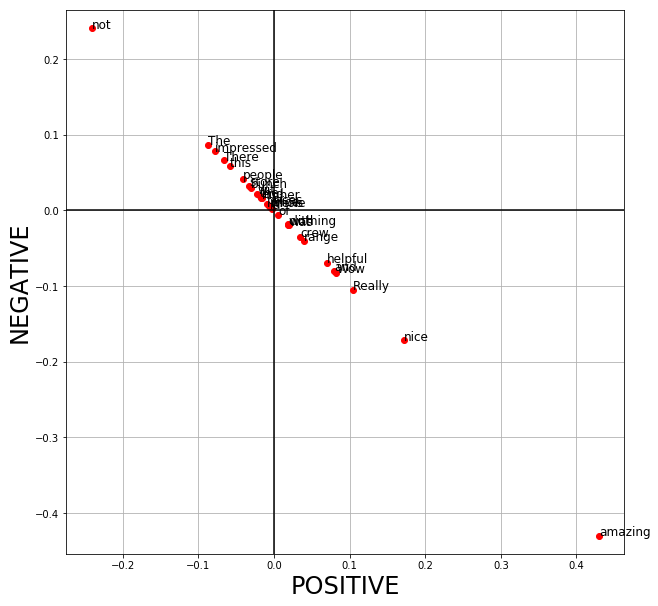

In [19]:
explain_sentences([fp[18]])

###Explanation for false negative example

/usr/lib/python3.6/re.py:212: FutureWarning: split() requires a non-empty pattern match.
  return _compile(pattern, flags).split(string, maxsplit)
/usr/lib/python3.6/re.py:212: FutureWarning: split() requires a non-empty pattern match.
  return _compile(pattern, flags).split(string, maxsplit)


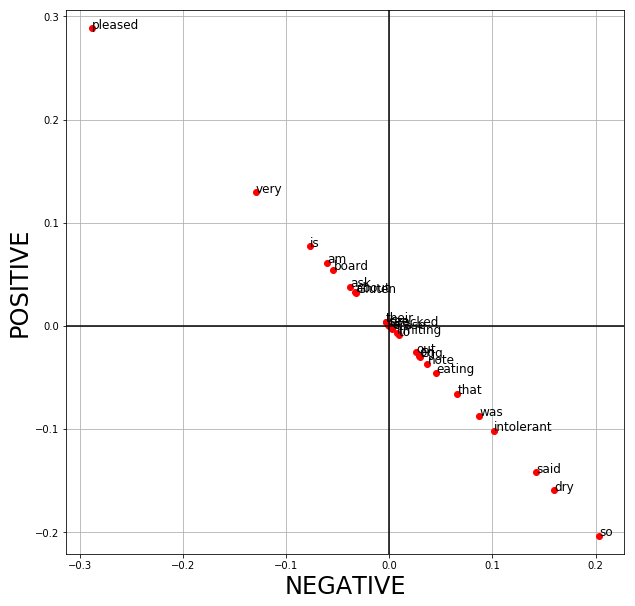

In [20]:
explain_sentences([fn[25]])

###Explanation for sentence that is not confident

/usr/lib/python3.6/re.py:212: FutureWarning: split() requires a non-empty pattern match.
  return _compile(pattern, flags).split(string, maxsplit)
/usr/lib/python3.6/re.py:212: FutureWarning: split() requires a non-empty pattern match.
  return _compile(pattern, flags).split(string, maxsplit)


'POSITIVE'

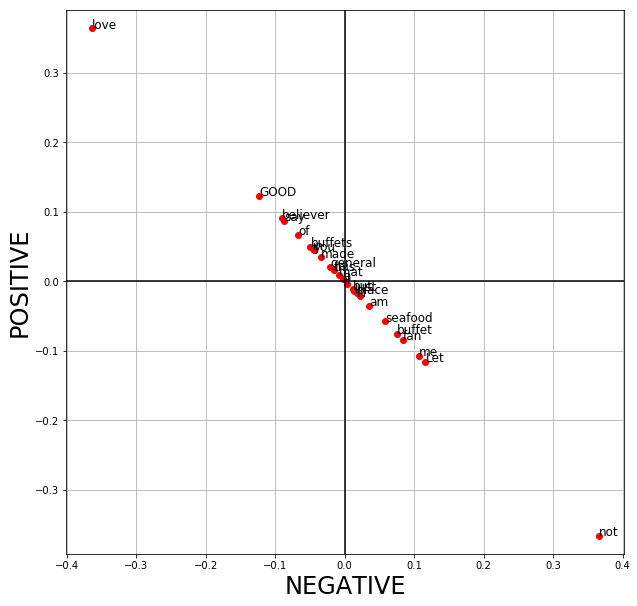

In [21]:
explain_sentences([lowest_confidence_sent])
labels[lowest_idx]

###Explanation for user input text

/usr/lib/python3.6/re.py:212: FutureWarning: split() requires a non-empty pattern match.
  return _compile(pattern, flags).split(string, maxsplit)
/usr/lib/python3.6/re.py:212: FutureWarning: split() requires a non-empty pattern match.
  return _compile(pattern, flags).split(string, maxsplit)


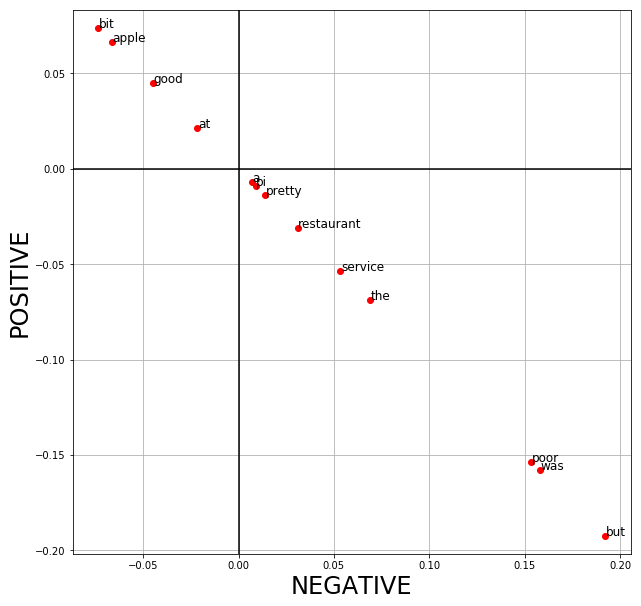

In [35]:
# Enter sentence here!
input_sentence = "the apple pi at the restaurant was pretty good but the service was a bit poor"
explain_sentences([input_sentence])

#News category dataset

## Reading in files

In [23]:
!gdown "https://drive.google.com/uc?export=download&id=1F91kbVsu8Zl_VXkgkX4pOEDLb4Lzgnmg"

Downloading...
From: https://drive.google.com/uc?export=download&id=1F91kbVsu8Zl_VXkgkX4pOEDLb4Lzgnmg
To: /content/news_dataset.tar.gz
6.98MB [00:00, 109MB/s]


In [24]:
print("Reading data")
news_tarfname = "news_dataset.tar.gz"
news_categories_data = read_files(news_tarfname)

Reading data
-- train data
train.tsv
Number of documents in training data:      60311
-- dev data
dev.tsv
Number of documents in dev data:      17232


## Training classifier

In [25]:
print("\nTraining classifier")
news_cls = train_classifier(news_categories_data)


Training classifier


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:469: FutureWarning: Default multi_class will be changed to 'auto' in 0.22. Specify the multi_class option to silence this warning.
  "this warning.", FutureWarning)


Classifier chosen with c-value: 100.000000
Evaluation of classifier on different c values:
c          | train_acc  | dev_acc   
--------------------------------------------------
100.000000 |   0.999967 |   0.916202


## Explaining data

### Setup

In [0]:
news_c = make_pipeline(news_categories_data.tfidf_vec, news_cls)
news_explainer = LimeTextExplainer(class_names=news_categories_data.target_labels)

In [0]:
def explain_news(sentences):
  for sentence in sentences:
    plot_words(sentence, news_explainer, news_c, news_categories_data.target_labels)
    exp = news_explainer.explain_instance(sentence, news_c.predict_proba, num_features=10, top_labels=5)
    exp.show_in_notebook(text=True)

In [28]:
news_tarfile = tarfile.open(news_tarfname, "r:gz")
news_test_data, news_test_labels = read_tsv(news_tarfile, 'unlabeled.tsv')
news_predicted_proba = news_c.predict_proba(news_test_data)

unlabeled.tsv


In [0]:
news_correct = []
news_wrong = []

lowest_news_confidence = 1
lowest_news_idx = -1
for i in range(len(news_test_data)):
  news_max_proba = max(news_predicted_proba[i])
  if news_max_proba < lowest_news_confidence:
    lowest_news_confidence = news_max_proba
    lowest_news_idx = i
  news_prediction = news_categories_data.target_labels[np.argmax(news_predicted_proba[i])]
  if news_prediction == news_test_labels[i]:
    news_correct.append(news_test_data[i])
  else:
    news_wrong.append((news_test_data[i], news_test_labels[i]))
    
lowest_confidence_news = news_test_data[lowest_news_idx]

In [30]:
news_categories_data.target_labels

array(['ENTERTAINMENT', 'POLITICS', 'STYLE & BEAUTY', 'TRAVEL',
       'WELLNESS'], dtype='<U14')

###Explanation for correctly classfied example

/usr/lib/python3.6/re.py:212: FutureWarning: split() requires a non-empty pattern match.
  return _compile(pattern, flags).split(string, maxsplit)
/usr/lib/python3.6/re.py:212: FutureWarning: split() requires a non-empty pattern match.
  return _compile(pattern, flags).split(string, maxsplit)


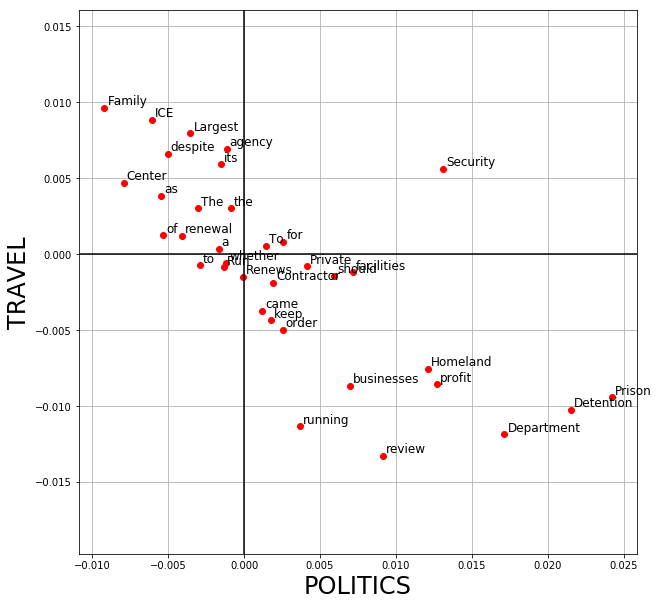

In [31]:
explain_news([news_correct[30]])

###Explanation for wrongly classfied example

/usr/lib/python3.6/re.py:212: FutureWarning: split() requires a non-empty pattern match.
  return _compile(pattern, flags).split(string, maxsplit)
/usr/lib/python3.6/re.py:212: FutureWarning: split() requires a non-empty pattern match.
  return _compile(pattern, flags).split(string, maxsplit)


Actual label: POLITICS


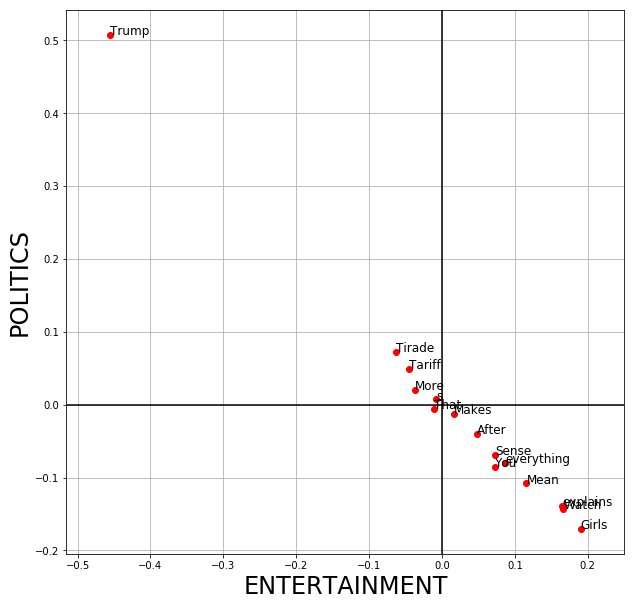

In [32]:
explain_news([news_wrong[30][0]])
print("Actual label: %s" % (news_wrong[30][1]))

###Explanation for uncertain example

/usr/lib/python3.6/re.py:212: FutureWarning: split() requires a non-empty pattern match.
  return _compile(pattern, flags).split(string, maxsplit)
/usr/lib/python3.6/re.py:212: FutureWarning: split() requires a non-empty pattern match.
  return _compile(pattern, flags).split(string, maxsplit)


Actual label: STYLE & BEAUTY


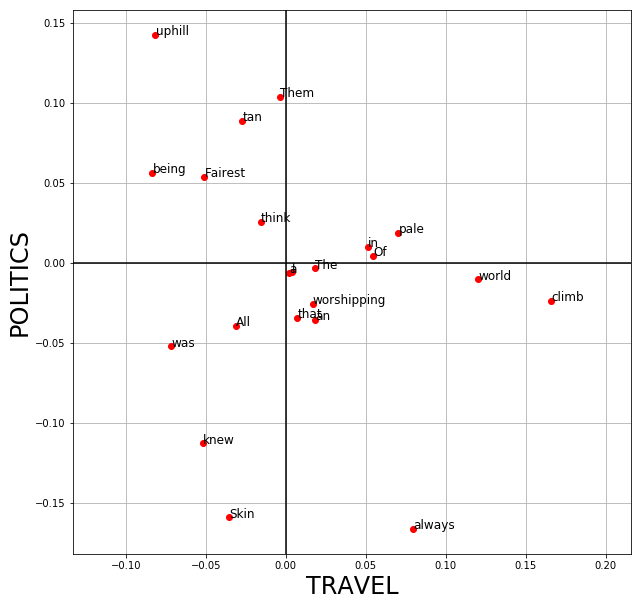

In [33]:
explain_news([lowest_confidence_news])
print("Actual label: %s" % news_test_labels[lowest_news_idx])

###Explanation for user-input example

/usr/lib/python3.6/re.py:212: FutureWarning: split() requires a non-empty pattern match.
  return _compile(pattern, flags).split(string, maxsplit)
/usr/lib/python3.6/re.py:212: FutureWarning: split() requires a non-empty pattern match.
  return _compile(pattern, flags).split(string, maxsplit)


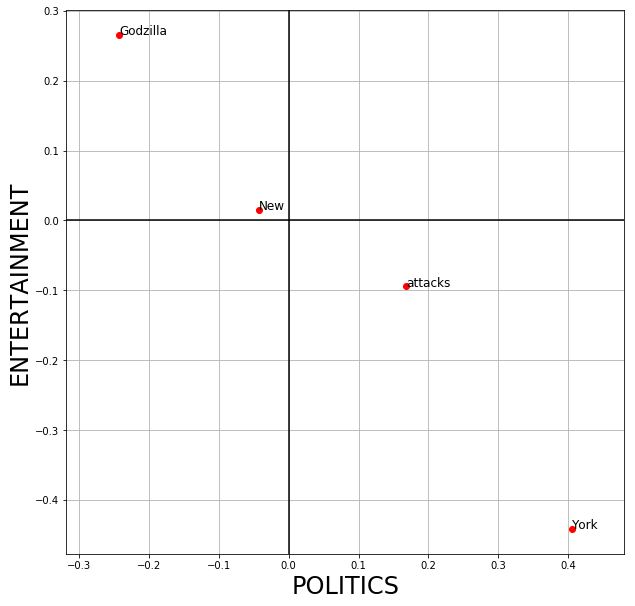

In [38]:
news_example = "Godzilla attacks New York"
explain_news([news_example])